# Predicting Customer Turnover by using various Machine learning Algorithms

Customer Turnover or churn rate, is the percentage of an organization's customer base lost during a given period of time, usually a month or annual basis. It can be an indicator of customer dissatisfaction, cheaper and/or better offers from the competition, better marketing strategies from the competition. 

The goal of this project is to predict the customer churn in a Telecommunication company. We will deploy over several classification machine learning algorithms to determine the customers' willingness to churn. We will also be exploring various factors that contribute towards the customer dissatisfaction and their willingness to churn.

The features in this dataset include the following:

*demographic data:* Gender, SeniorCitizen, Partner, Dependents

*subscribed services:* PhoneService, MultipleLine, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies

*customer account information:* customerID, Contract, PaperlessBilling, PaymentMethod, MonthlyCharges, TotalCharges, Tenure

*Target:* Churn


In [54]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
%matplotlib inline
sns.set_style('white')
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss, fbeta_score
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve

In [55]:
df = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')
df.head(10)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [56]:
# Let's get the shape of the dataframe
print (f'There are {df.shape[0]} instances and {df.shape[1]} features in the dataframe')

There are 7043 instances and 21 features in the dataframe


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


From the above info, we can see that there are only 2 features that are of int64 dtype, 1 float64 dtype and 18 object data types.

## Data Preprocessing 

In [58]:
# Since customerID is a redundant feature column we will be dropping it
df.drop('customerID',inplace=True, axis = 1)

In [59]:
# Getting the values for column 'TotalCharges'
df.TotalCharges.value_counts()[:10]

20.2     11
         11
19.75     9
19.65     8
20.05     8
19.9      8
19.55     7
45.3      7
20.25     6
20.15     6
Name: TotalCharges, dtype: int64

From the above observation we can see that there are 11 occurences of ' ' in the column

In [60]:
# Replacing the ' ' with missing values
df['TotalCharges'].replace([' ', np.nan], inplace=True)

In [61]:
df.isnull().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [62]:
# Removing null values in the dataframe
df.dropna(inplace=True)
df.isnull().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [63]:
# Converting the column 'TotalCharges' to numeric
df.TotalCharges = pd.to_numeric(df['TotalCharges'])

## Exploratory Data Analysis

In [64]:
# Number of unique values in each columns
df.nunique()

gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6530
Churn                  2
dtype: int64

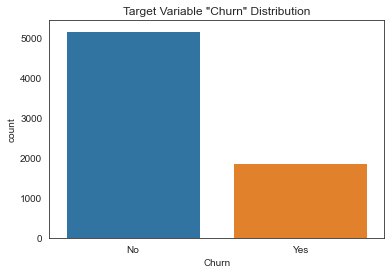

In [65]:
# Let's check the distribution of target variable 'Churn'
sns.countplot(x='Churn',data = df)
plt.title('Target Variable "Churn" Distribution');

In [66]:
print (f"Target variable has {round((df[df.Churn =='Yes'].shape[0]/df.shape[0])*100,2)}% of 'Yes' and {round((df[df.Churn=='No'].shape[0]/df.shape[0])*100,2)}% of 'No'")

Target variable has 26.54% of 'Yes' and 73.46% of 'No'


In [67]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692,2285.169963
std,0.368612,24.559481,30.090047,2267.544511
min,0.000000,0.000000,18.250000,18.800000
25%,0.000000,9.000000,35.500000,401.675000
50%,0.000000,29.000000,70.350000,1398.250000
75%,0.000000,55.000000,89.850000,3803.050000
max,1.000000,72.000000,118.750000,8684.800000


In [68]:
# Changing the 'SeniorCitizen' column datatype to 'category' datatype
df['SeniorCitizen'] = df['SeniorCitizen'].astype('category')

In [69]:
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,2285.169963
std,24.559481,30.090047,2267.544511
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,401.675000
50%,29.000000,70.350000,1398.250000
75%,55.000000,89.850000,3803.050000
max,72.000000,118.750000,8684.800000


In [70]:
num_cols = ['tenure','MonthlyCharges','TotalCharges']

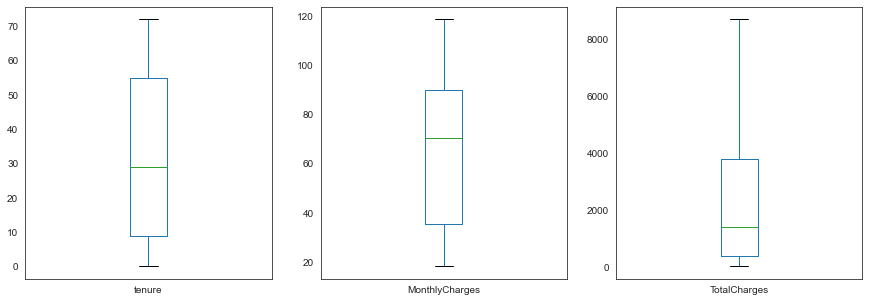

In [71]:
df[num_cols].plot.box(figsize = (15,5),subplots = True);

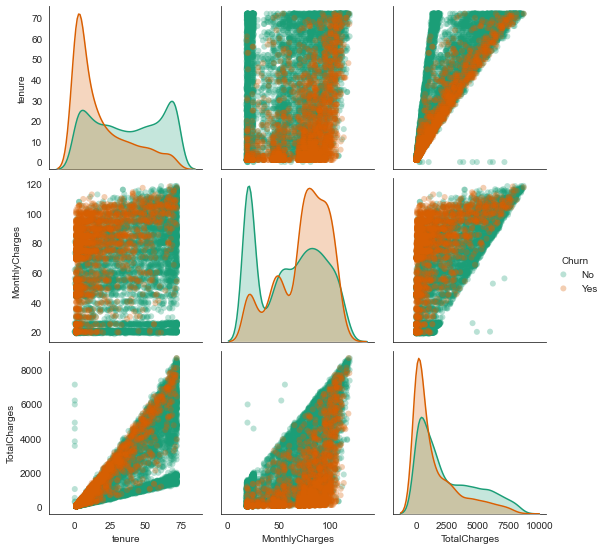

In [72]:
sns.pairplot(df[['tenure','MonthlyCharges','TotalCharges','Churn']], hue='Churn', palette='Dark2',plot_kws=dict(alpha=.3, edgecolor='none'));

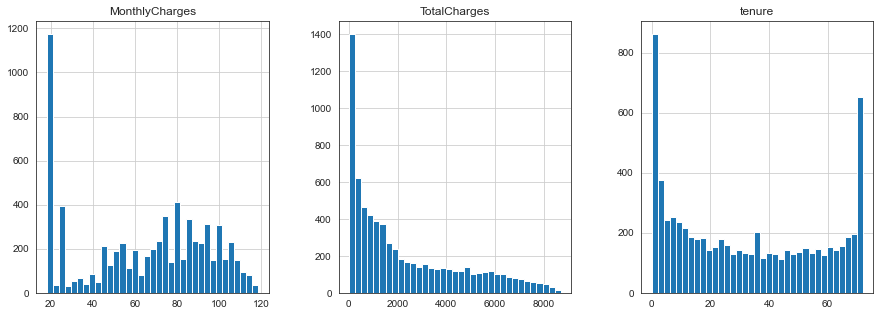

In [73]:
fig , ax = plt.subplots(1,3,figsize=(15,5))
df[num_cols].hist(bins = 35,ax=ax);

From the above histogram plots, we can see that 'TotalCharges' column is highly skewed to the right. We will be using a box cox transformation for it.

In [74]:
df['TotalCharges'], lambdax= stats.boxcox(df['TotalCharges'])

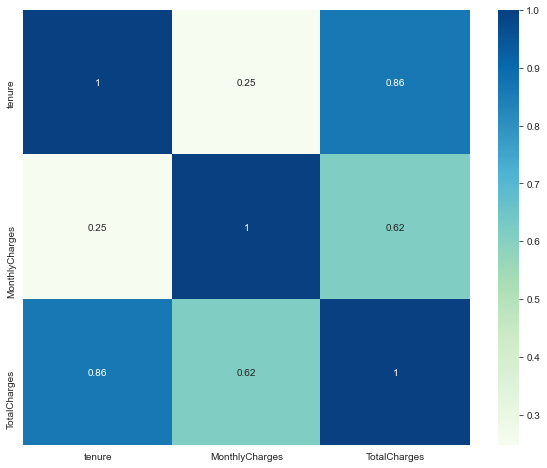

In [75]:
# Correlation matrix
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),cmap='GnBu', annot=True);

From the above heatmap we can see that there is highly correlation between features 'tenure' and 'TotalCharges'. Hence, we can drop the 'tenure' column from the dataframe.

In [76]:
# Dropping the 'tenure' column
df.drop('tenure',axis=1,inplace=True)

In [77]:
# Feature Selection: Features are selected mainly based on Lasso Coefficient and using Random Forest. The p-values and coefficients from stats models have also been considered.

In [78]:
# Splitting into dependant features and target variables
X, y = df.drop('Churn',axis = 1), df[['Churn']]
categ_cols = [x for x in X.columns if x not in num_cols]

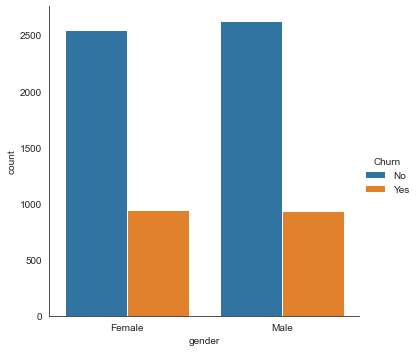

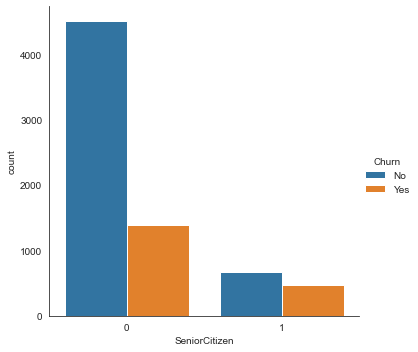

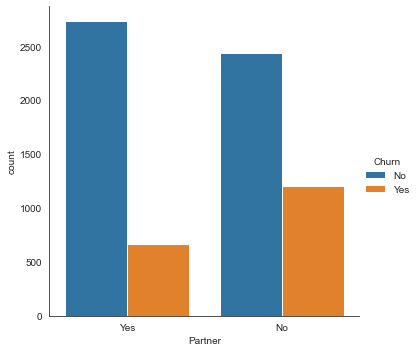

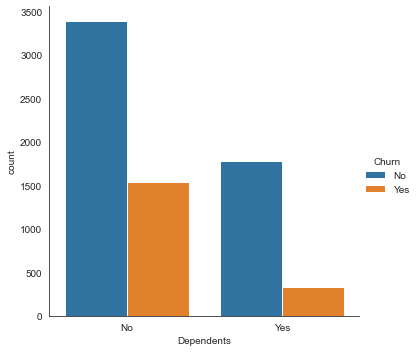

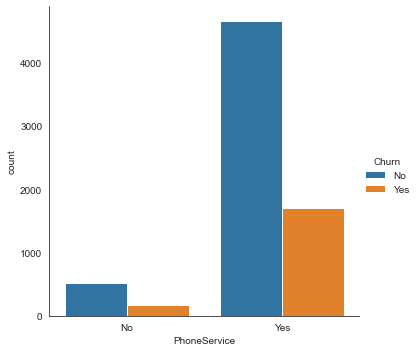

...

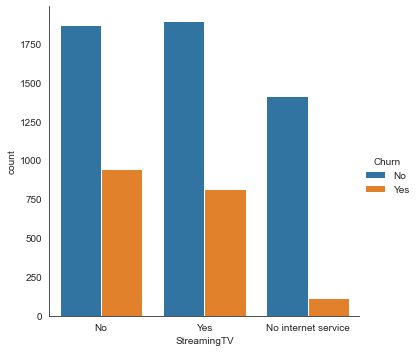

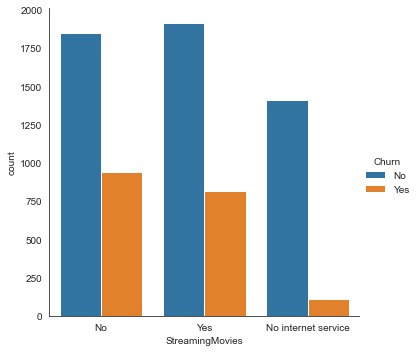

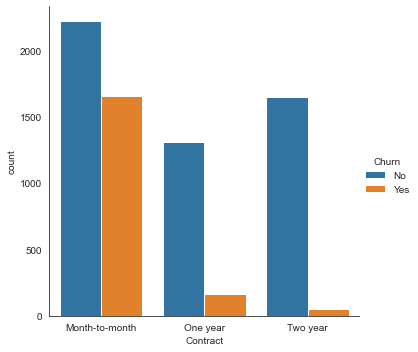

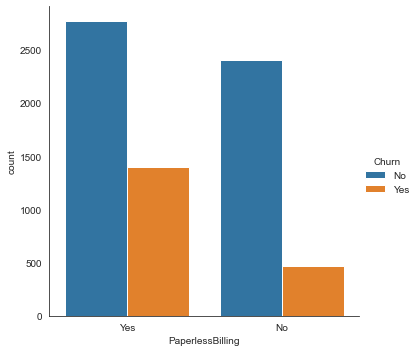

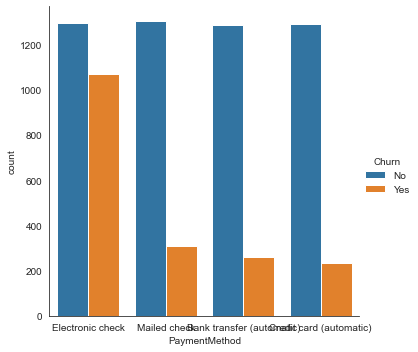

In [79]:
# Let's analyse the categorical features
for col in categ_cols:
    sns.catplot(x=col,hue = 'Churn',data = df, kind = 'count')

### Data Preprocessing

In [80]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
multi_cols = [x for x in X.columns if df[x].nunique() >2 and df[x].dtypes == object]
bin_cols = [x for x in X.columns if df[x].nunique() == 2]

In [81]:
le = LabelEncoder()
for i in bin_cols:
    X[i] = le.fit_transform(X[i])


In [82]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   int64  
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   int64  
 3   Dependents        7043 non-null   int64  
 4   PhoneService      7043 non-null   int64  
 5   MultipleLines     7043 non-null   object 
 6   InternetService   7043 non-null   object 
 7   OnlineSecurity    7043 non-null   object 
 8   OnlineBackup      7043 non-null   object 
 9   DeviceProtection  7043 non-null   object 
 10  TechSupport       7043 non-null   object 
 11  StreamingTV       7043 non-null   object 
 12  StreamingMovies   7043 non-null   object 
 13  Contract          7043 non-null   object 
 14  PaperlessBilling  7043 non-null   int64  
 15  PaymentMethod     7043 non-null   object 
 16  MonthlyCharges    7043 non-null   float64


In [83]:
# Getting dummies for mutli value columns
X = pd.get_dummies(data = X, columns=multi_cols)

In [84]:
X.head()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,MultipleLines_No phone service,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,0,1,29.85,5.401162,0,1,...,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,1,0,56.95,22.921101,1,0,...,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,1,1,53.85,9.023040,1,0,...,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,0,0,42.30,22.742811,0,1,...,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,1,1,70.70,10.188239,1,0,...,1,0,0,1,0,0,0,0,1,0


In [85]:
print ('The new shape of the transformed dataframe:',X.shape)

The new shape of the transformed dataframe: (7043, 39)


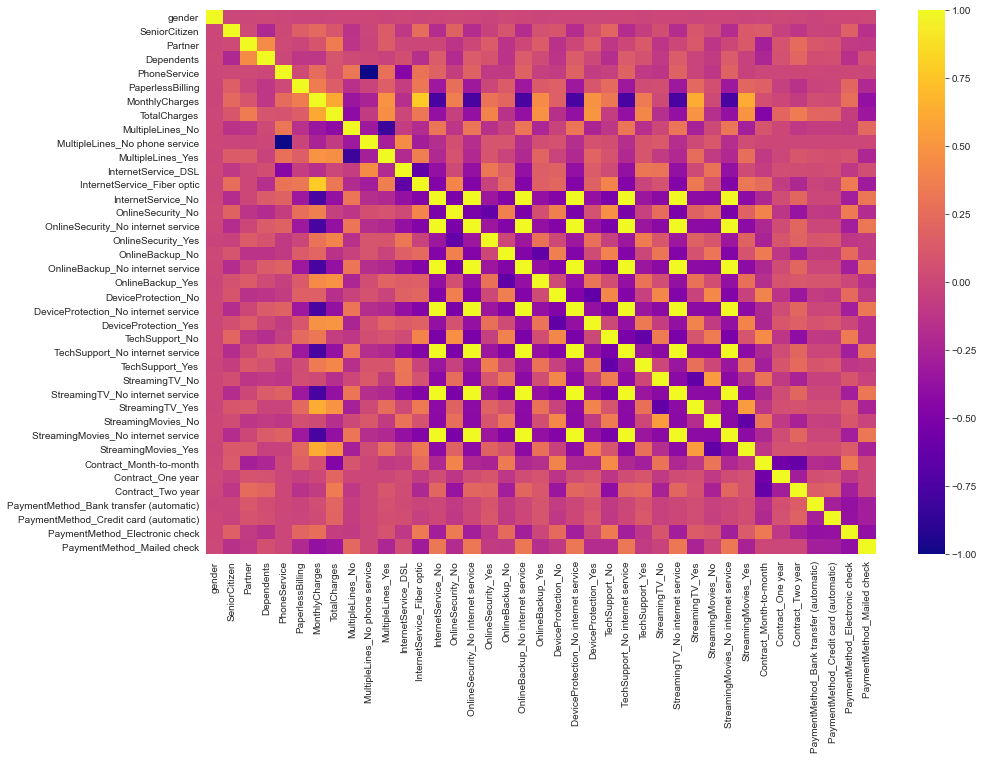

In [86]:
plt.figure(figsize=(15,10))
sns.heatmap(X.corr(),cmap = 'plasma');

In [87]:
# Dropping all the features (no internet service), excluding 1
import re
no_internet_columns = [x for x in X.columns if re.findall(r'No internet service$|No phone service$',x)]

In [88]:
no_internet_columns

['MultipleLines_No phone service',
 'OnlineSecurity_No internet service',
 'OnlineBackup_No internet service',
 'DeviceProtection_No internet service',
 'TechSupport_No internet service',
 'StreamingTV_No internet service',
 'StreamingMovies_No internet service']

In [89]:
X.drop(columns=no_internet_columns,inplace= True)

In [90]:
X.head()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,MultipleLines_Yes,...,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,0,1,29.85,5.401162,0,0,...,0,1,0,1,0,0,0,0,1,0
1,1,0,0,0,1,0,56.95,22.921101,1,0,...,0,1,0,0,1,0,0,0,0,1
2,1,0,0,0,1,1,53.85,9.023040,1,0,...,0,1,0,1,0,0,0,0,0,1
3,1,0,0,0,0,0,42.30,22.742811,0,0,...,0,1,0,0,1,0,1,0,0,0
4,0,0,0,0,1,1,70.70,10.188239,1,0,...,0,1,0,1,0,0,0,0,1,0


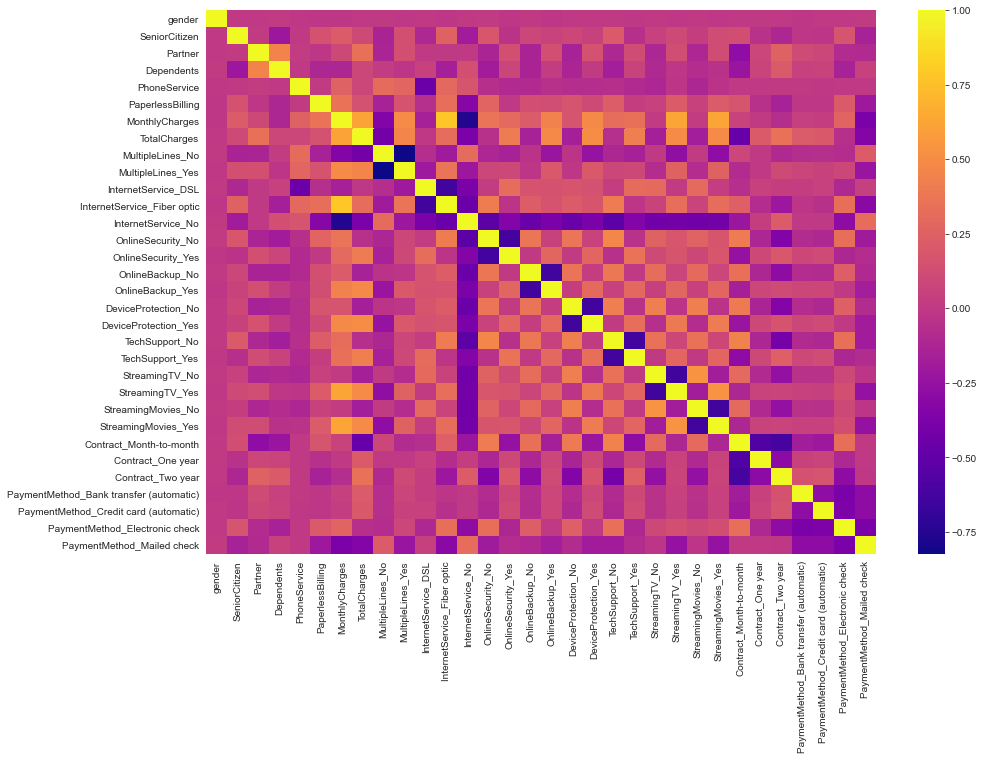

In [91]:
plt.figure(figsize=(15,10))
sns.heatmap(X.corr(),cmap = 'plasma');

### Feature Selection

In [92]:
# Use LassoCV to find the optimal alpha values for L1 regulariztion
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.preprocessing import PolynomialFeatures
y = le.fit_transform(y)
std = StandardScaler()
std.fit(X)
X_scaled = std.transform(X) 
# Run the cross validation, find the best alpha, refit the model on all the data with that alpha
alphavec = 10**np.linspace(-3,3,200)
lasso_model = LassoCV(alphas= alphavec, cv = 5)
lasso_model.fit(X_scaled, y)
# Best alpha value found
print ('Lasso Best Alpha is:', lasso_model.alpha_)

Lasso Best Alpha is: 0.0014149912974345759


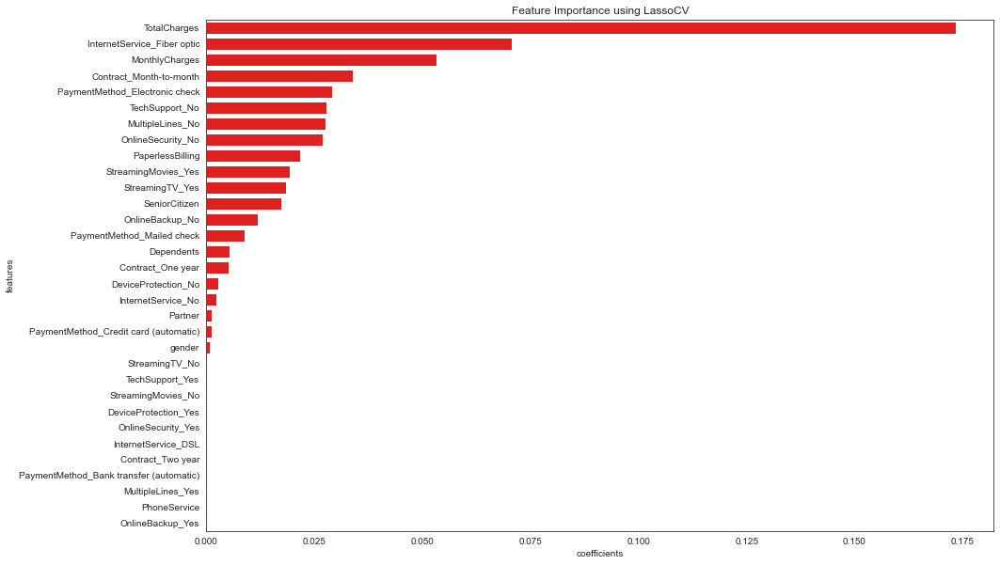

In [93]:
feat_import = {'features':[],'coefficients':[]}
for i, k in zip(X.columns, lasso_model.coef_):
    feat_import['features'].append(i)
    feat_import['coefficients'].append(abs(k))
feat_import_dfl = pd.DataFrame.from_dict(feat_import)
plt.figure(figsize=(15,10))
plt.title('Feature Importance using LassoCV')
sns.barplot(x = feat_import_dfl['coefficients'], y = feat_import_dfl['features'], color='r', order = feat_import_dfl.sort_values('coefficients',ascending = False).features);

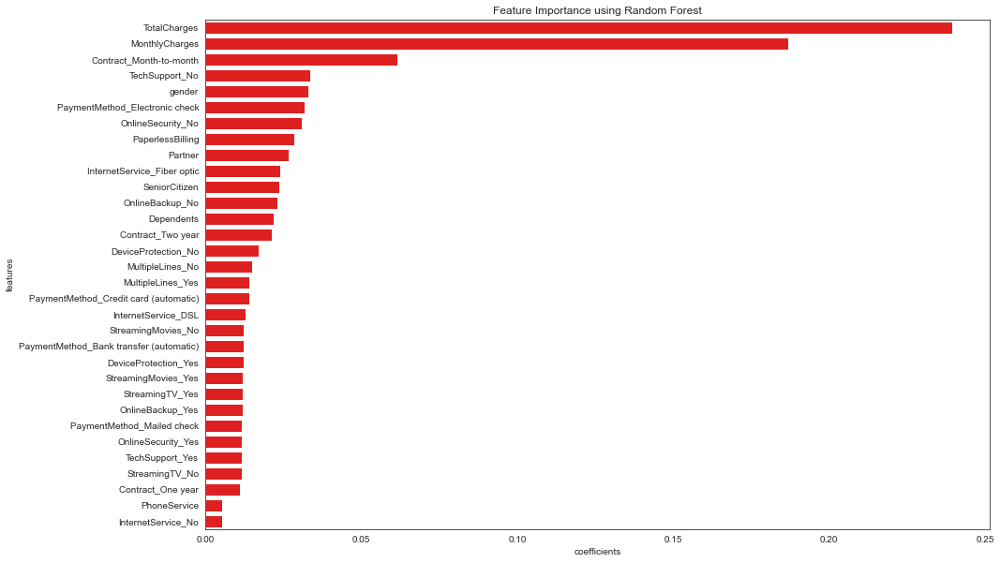

In [94]:
# Now using Random forest for feature importance
rf = RandomForestClassifier(random_state = 43, n_estimators = 100)
model = rf.fit(X,y)
feat_import = {'features':[],'coefficients':[]}
for i, k in zip(X.columns, rf.feature_importances_):
    feat_import['features'].append(i)
    feat_import['coefficients'].append(k)
feat_import_rf = pd.DataFrame.from_dict(feat_import)
plt.figure(figsize=(15,10))
plt.title('Feature Importance using Random Forest')
sns.barplot(x = feat_import_rf['coefficients'], y = feat_import_rf['features'], color='r', order = feat_import_rf.sort_values('coefficients',ascending = False).features);


In [95]:
# Features selected using LassoCV greater than 0
lass_cols = list(feat_import_dfl[feat_import_dfl['coefficients']>0].features)
lass_cols

['gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'PaperlessBilling',
 'MonthlyCharges',
 'TotalCharges',
 'MultipleLines_No',
 'InternetService_Fiber optic',
 'InternetService_No',
 'OnlineSecurity_No',
 'OnlineBackup_No',
 'DeviceProtection_No',
 'TechSupport_No',
 'StreamingTV_Yes',
 'StreamingMovies_Yes',
 'Contract_Month-to-month',
 'Contract_One year',
 'PaymentMethod_Credit card (automatic)',
 'PaymentMethod_Electronic check',
 'PaymentMethod_Mailed check']

In [96]:
# Important features selected by using Random Forest with a threshold of 0.01
rf_cols = list(feat_import_rf[feat_import_rf['coefficients']>0.01].features)
rf_cols

['gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'PaperlessBilling',
 'MonthlyCharges',
 'TotalCharges',
 'MultipleLines_No',
 'MultipleLines_Yes',
 'InternetService_DSL',
 'InternetService_Fiber optic',
 'OnlineSecurity_No',
 'OnlineSecurity_Yes',
 'OnlineBackup_No',
 'OnlineBackup_Yes',
 'DeviceProtection_No',
 'DeviceProtection_Yes',
 'TechSupport_No',
 'TechSupport_Yes',
 'StreamingTV_No',
 'StreamingTV_Yes',
 'StreamingMovies_No',
 'StreamingMovies_Yes',
 'Contract_Month-to-month',
 'Contract_One year',
 'Contract_Two year',
 'PaymentMethod_Bank transfer (automatic)',
 'PaymentMethod_Credit card (automatic)',
 'PaymentMethod_Electronic check',
 'PaymentMethod_Mailed check']

In [97]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
# Scaling the features between 0 and 1
min_max = MinMaxScaler()
# Selecting only the features which are of importance (lasso columns)
X = X[lass_cols]
# Standardizing the new dataframe
min_max.fit(X)
X_scaled = min_max.transform(X)

# Splitting it into train and test
X_train,X_test, y_train, y_test = train_test_split(X_scaled,y,test_size=.25,random_state=42)
X_scaled

array([[0., 0., 1., ..., 0., 1., 0.],
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 1., ..., 0., 1., 0.],
       [1., 1., 1., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [98]:
def model_report(model_name, model):
    print('\nSearch for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data')
    model.fit(X_train, y_train)
    optimal_th = 0.5   # start with default threshold value
    
    for i in range(0,3):
        score_list = []
        th_list = [np.linspace(optimal_th-0.4999, optimal_th+0.4999, 11), 
                 np.linspace(optimal_th-0.1, optimal_th+0.1, 21), 
                 np.linspace(optimal_th-0.01, optimal_th+0.01, 21)]
        for th in th_list[i]:
            y_pred = (model.predict_proba(X_test)[:,1] >= th)
            f1scor = f1_score(y_test, y_pred)
            score_list.append(f1scor)
    
        optimal_th = float(th_list[i][score_list.index(max(score_list))])

    print('optimal F1 score = {:.4f}'.format(max(score_list)))
    print('optimal threshold = {:.3f}'.format(optimal_th))

    print(model_name, 'accuracy score is')
    print('Training: {:.2f}%'.format(100*model.score(X_train, y_train)))  # score uses accuracy
    print('Test set: {:.2f}%'.format(100*model.score(X_test, y_test)))   # should use cross validation


    y_pred = (model.predict_proba(X_test)[:,1] >= optimal_th)
    print('\nOptimal threshold : {:.3f}'.format(optimal_th))
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
    plt.figure(figsize=(10,8))
    plt.title(f'Confusion Matrix - {model_name}')
    sns.heatmap(confusion_matrix(y_test, y_pred), cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['No Churn', 'Churn'],
           yticklabels=['No Churn', 'Churn'])
    plt.show()
    
    global model_f1, model_auc, model_ll, model_roc_auc
    model_f1 = f1_score(y_test, y_pred)

    y_pred = model.predict_proba(X_test)
    model_ll = log_loss(y_test, y_pred)
    print(model_name, 'Log-loss: {:.4f}'.format(model_ll))
    y_pred = model.predict(X_test)
    model_roc_auc = roc_auc_score(y_test, y_pred)
    print(model_name, 'roc_auc_score: {:.4f}'.format(model_roc_auc)) 
    y_pred = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    model_auc = auc(fpr, tpr)
    print(model_name, 'AUC: {:.4f}'.format(model_auc))
    

    # plot the ROC curve
    plt.figure(figsize = [6,6])
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % model_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()
  
    return

# initialise lists to collect the results to plot later
model_list = []
f1_list = []
auc_list = []
ll_list = []
roc_auc_list = []



""" Logistic Regression """
Optimal cv F1 Score = 0.5885

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6702
optimal threshold = 0.297
Logistic Regression accuracy score is
Training: 80.88%
Test set: 81.03%

Optimal threshold : 0.297
Precision: 0.5768,   Recall: 0.7996,   F1 Score: 0.6702


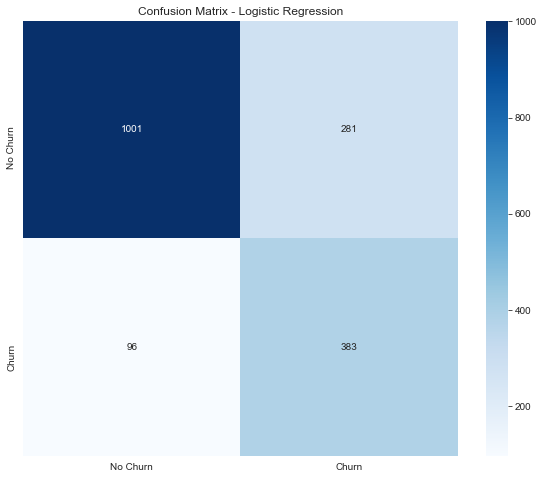

Logistic Regression Log-loss: 0.4019
Logistic Regression roc_auc_score: 0.7279
Logistic Regression AUC: 0.8621


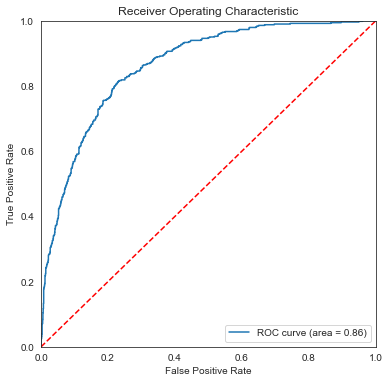

In [99]:
print ('\n""" Logistic Regression """')
kf = KFold(n_splits=5, random_state=42, shuffle = True)
score_list=[]
c_list = 10**np.linspace(-3,3,200)
for c in c_list:
    log_reg = LogisticRegression(C = c)
    cvs = (cross_val_score(log_reg,X_train, y_train, cv=kf, scoring = 'f1')).mean()
    score_list.append(cvs)
print (f"Optimal cv F1 Score = {max(score_list):.4f}")
optimal_c = float(c_list[score_list.index(max(score_list))])
log_reg = LogisticRegression(C = optimal_c)
model_report('Logistic Regression',log_reg)

model_list.append('Logistic Regression')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)




""" Gaussian NB """

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6472
optimal threshold = 0.741
Gaussian NB accuracy score is
Training: 74.12%
Test set: 75.13%

Optimal threshold : 0.741
Precision: 0.5624,   Recall: 0.7620,   F1 Score: 0.6472


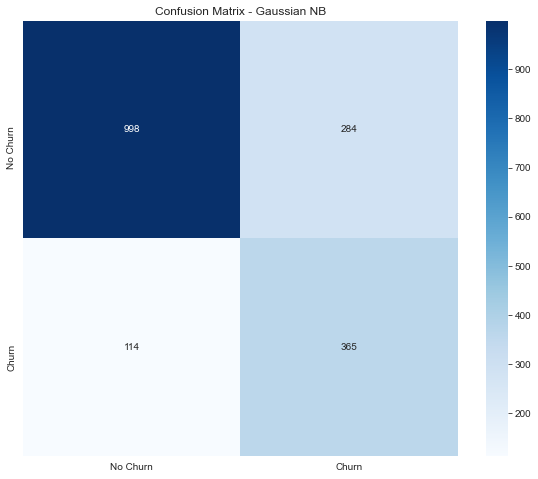

Gaussian NB Log-loss: 1.1319
Gaussian NB roc_auc_score: 0.7677
Gaussian NB AUC: 0.8287


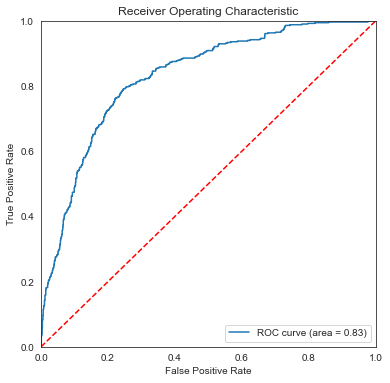

In [100]:
print ('\n""" Gaussian NB """')
gb = GaussianNB()
model_report('Gaussian NB',gb)

model_list.append('Gaussian NB')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)


""" Bernoulli NB """

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6370
optimal threshold = 0.522
Bernoulli NB accuracy score is
Training: 75.26%
Test set: 76.09%

Optimal threshold : 0.522
Precision: 0.5472,   Recall: 0.7620,   F1 Score: 0.6370


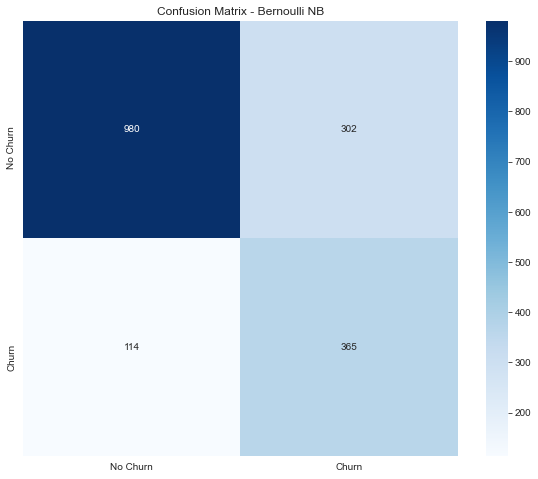

Bernoulli NB Log-loss: 0.7309
Bernoulli NB roc_auc_score: 0.7632
Bernoulli NB AUC: 0.8284


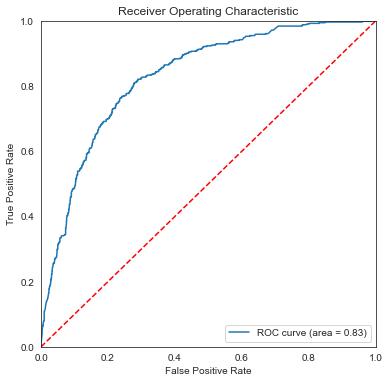

In [101]:
print ('\n""" Bernoulli NB """')
bb = BernoulliNB()
model_report('Bernoulli NB',bb)

model_list.append('Bernoulli NB')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)


""" KNN Classifier"""
optimal cv F1 score = 0.5690
optimal value of K = 19

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6377
optimal threshold = 0.264
KNN accuracy score is
Training: 80.67%
Test set: 78.99%

Optimal threshold : 0.264
Precision: 0.5127,   Recall: 0.8434,   F1 Score: 0.6377


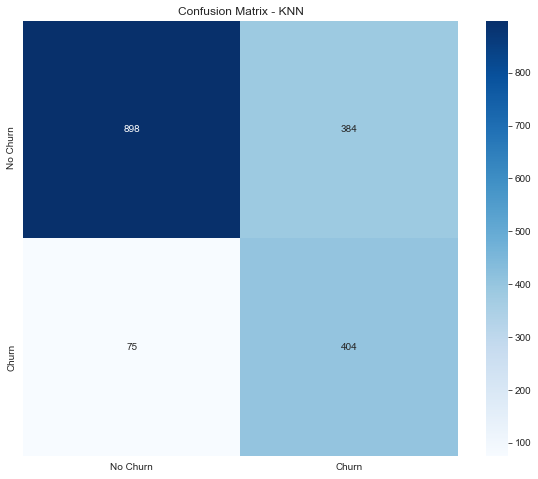

KNN Log-loss: 0.5464
KNN roc_auc_score: 0.7119
KNN AUC: 0.8386


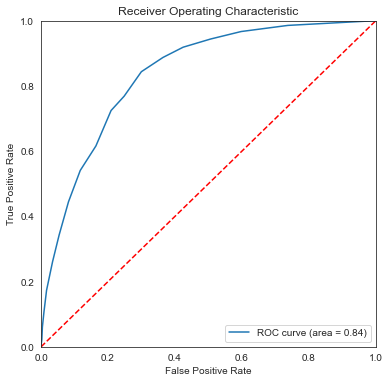


Compare with KNN classification_report (same as default threshold 0.50)
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      1282
           1       0.63      0.54      0.58       479

    accuracy                           0.79      1761
   macro avg       0.74      0.71      0.72      1761
weighted avg       0.78      0.79      0.78      1761



In [102]:
print('\n""" KNN Classifier"""')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
k_scores = []
for k in range(1, 21):
    knn = KNeighborsClassifier(n_neighbors = k)
    cvs = cross_val_score(knn, X_train, y_train, cv=kf, scoring='f1').mean()
    k_scores.append(cvs)
print('optimal cv F1 score = {:.4f}'.format(max(k_scores)))   # 4 decimal pl
optimal_k = k_scores.index(max(k_scores))+1   # index 0 is for k=1
print('optimal value of K =', optimal_k)

knn = KNeighborsClassifier(n_neighbors = optimal_k)
model_report('KNN', knn)

print('\nCompare with KNN classification_report (same as default threshold 0.50)')
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

model_list.append('KNN')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)



""" DecisionTreeClassifier """
Optimal F1 score = 0.5839
Optimal max_depth = 4

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6386
optimal threshold = 0.243
DecisionTreeClassifier accuracy score is
Training: 79.72%
Test set: 78.53%

Optimal threshold : 0.243
Precision: 0.5587,   Recall: 0.7453,   F1 Score: 0.6386


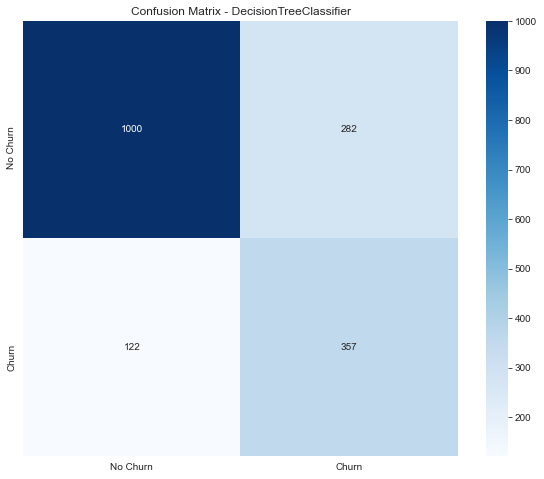

DecisionTreeClassifier Log-loss: 0.5013
DecisionTreeClassifier roc_auc_score: 0.6872
DecisionTreeClassifier AUC: 0.8345


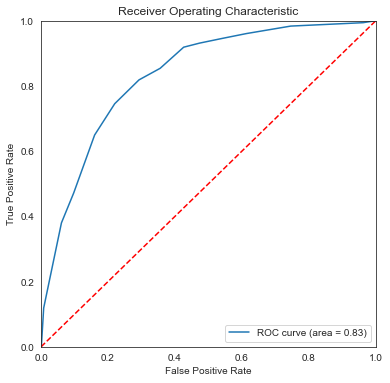

In [103]:
print ('\n""" DecisionTreeClassifier """')
# For finding the optimal max_depth, varying from 2 to 10, using KFold(5) Cross Validation on train data
kf = KFold(n_splits=5, random_state = 21, shuffle =True)
d_score = []
for d in range(2,11):
    dec_tree = DecisionTreeClassifier(max_depth=d)
    cvs = cross_val_score(dec_tree, X_train, y_train, cv=kf, scoring='f1').mean()
    d_score.append(cvs)
print (f'Optimal F1 score = {max(d_score):.4f}')
optimal_d = d_score.index(max(d_score))+2
print ('Optimal max_depth =',optimal_d)

dec_tree = DecisionTreeClassifier(max_depth=optimal_d)
model_report('DecisionTreeClassifier',dec_tree)

model_list.append('DecisionTreeClassifier')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)


""" RandomForestClassifier """
Optimal F1 score = 0.5379
Optimal max_depth = 4

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data
optimal F1 score = 0.6319
optimal threshold = 0.307
RandomForestClassifier accuracy score is
Training: 99.85%
Test set: 79.10%

Optimal threshold : 0.307
Precision: 0.5484,   Recall: 0.7453,   F1 Score: 0.6319


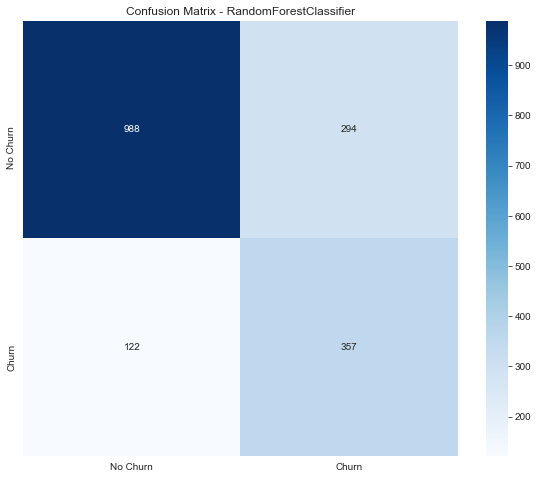

RandomForestClassifier Log-loss: 0.4501
RandomForestClassifier roc_auc_score: 0.6911
RandomForestClassifier AUC: 0.8339


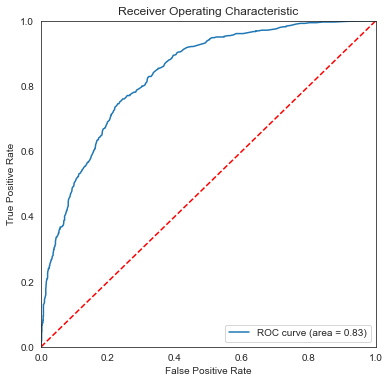

In [104]:
print ('\n""" RandomForestClassifier """')
# For finding the optimal n_estimators in Random Forest Classifier, varying from 100 to 500, using KFold(5) Cross Validation on train data
kf = KFold(n_splits=5, random_state = 21, shuffle =True)
score_list = []
n_list = []
for n in [100,150,200,250,300,350,400,450,500]:
    rand_tree = RandomForestClassifier(n_estimators=n)
    cvs = cross_val_score(rand_tree, X_train, y_train, cv=kf, scoring='f1').mean()
    score_list.append(cvs)
    n_list.append(n)
print (f'Optimal F1 score = {max(score_list):.4f}')
optimal_n = int(n_list[score_list.index(max(score_list))])
print ('Optimal max_depth =',optimal_d)

rand_tree = RandomForestClassifier(n_estimators=optimal_n)
model_report('RandomForestClassifier',rand_tree)

model_list.append('RandomForestClassifier')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)

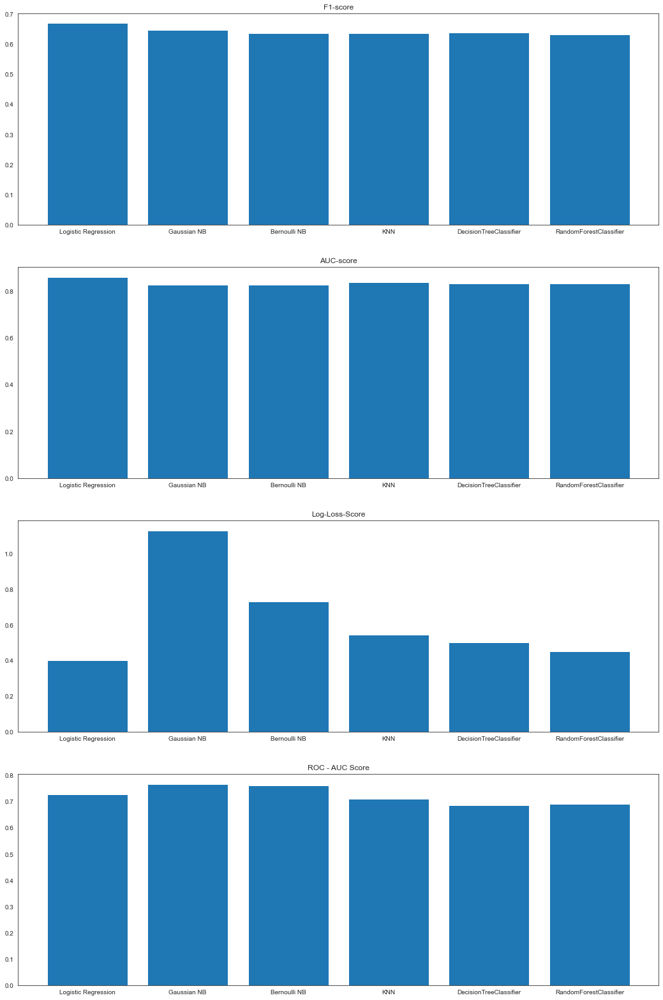

In [105]:
fig, ax = plt.subplots(4,1 , figsize=(18,28))

ax[0].bar(model_list, f1_list)
ax[0].set_title('F1-score')
ax[1].bar(model_list, auc_list)
ax[1].set_title('AUC-score')
ax[2].bar(model_list, ll_list)
ax[2].set_title('Log-Loss-Score')
ax[3].bar(model_list, roc_auc_list)
ax[3].set_title('ROC - AUC Score')

# Fine-tune figure: make subplots farther from each other, or nearer to each other.
fig.subplots_adjust(hspace=0.2, wspace=0.2)

In [ ]:
From the above, graphs, we can see that AUC-score, F1-score, 